In [1]:
from bs4 import BeautifulSoup
import urllib
from PIL import Image
import os

In [30]:
def downloadImages(keyword, number_of_pages, minimum):   
    start = 0
    images_links = []
    for page in range(number_of_pages):            
        url = "https://www.picsearch.com/index.cgi?start=" + str(start) + "&q=" + keyword
        response = urllib.request.urlopen(url)
        soup = BeautifulSoup(response)
        img_tag = soup.find_all('img')
        for tag in img_tag:
            images_links.append('http://' + tag['src'][2:77] + str(224))
        start = len(images_links) + 1                                    
    
    response = urllib.request.urlopen(url)    
    if not os.path.exists("data/" + keyword):
        os.makedirs("data/" + keyword)
    for count, image in enumerate(images_links):
        image = urllib.request.urlopen(image)
        image = Image.open(image)
        width, height = image.size        
        if (width > minimum) and (height > minimum):
            image.save(os.path.join('data', keyword, keyword + '_' + str(count) + '.jpg'))

In [ ]:
downloadImages('furniture', 200, 224) 

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [2]:
# Root directory for dataset
dataroot = "data/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 1000

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


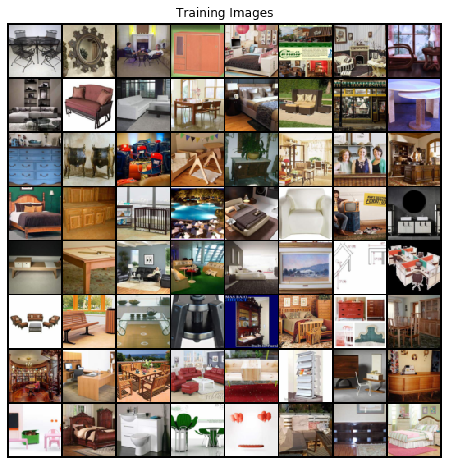

In [3]:
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))


In [4]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [5]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [6]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [7]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [8]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)



Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [9]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))


In [10]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1



Starting Training Loop...
[0/1000][0/11]	Loss_D: 1.8338	Loss_G: 6.9472	D(x): 0.6632	D(G(z)): 0.6764 / 0.0016
[1/1000][0/11]	Loss_D: 0.6427	Loss_G: 10.1160	D(x): 0.8261	D(G(z)): 0.2993 / 0.0001
[2/1000][0/11]	Loss_D: 0.4909	Loss_G: 18.5583	D(x): 0.6783	D(G(z)): 0.0000 / 0.0000
[3/1000][0/11]	Loss_D: 0.8210	Loss_G: 14.9689	D(x): 0.9775	D(G(z)): 0.4876 / 0.0000
[4/1000][0/11]	Loss_D: 0.1002	Loss_G: 7.9790	D(x): 0.9174	D(G(z)): 0.0006 / 0.0006
[5/1000][0/11]	Loss_D: 0.6395	Loss_G: 24.2161	D(x): 0.6554	D(G(z)): 0.0000 / 0.0000
[6/1000][0/11]	Loss_D: 0.4083	Loss_G: 11.2456	D(x): 0.9468	D(G(z)): 0.2662 / 0.0001
[7/1000][0/11]	Loss_D: 0.6746	Loss_G: 9.0054	D(x): 0.9209	D(G(z)): 0.3844 / 0.0005
[8/1000][0/11]	Loss_D: 1.0252	Loss_G: 5.0064	D(x): 0.9448	D(G(z)): 0.5430 / 0.0163
[9/1000][0/11]	Loss_D: 0.7260	Loss_G: 4.3258	D(x): 0.8838	D(G(z)): 0.3831 / 0.0193
[10/1000][0/11]	Loss_D: 0.5473	Loss_G: 3.6477	D(x): 0.8450	D(G(z)): 0.2567 / 0.0404
[11/1000][0/11]	Loss_D: 0.6039	Loss_G: 4.2757	D(x): 0.9

[97/1000][0/11]	Loss_D: 0.1504	Loss_G: 5.1949	D(x): 0.9653	D(G(z)): 0.1000 / 0.0126
[98/1000][0/11]	Loss_D: 0.8675	Loss_G: 7.3136	D(x): 0.9413	D(G(z)): 0.4454 / 0.0015
[99/1000][0/11]	Loss_D: 0.6197	Loss_G: 6.2701	D(x): 0.8281	D(G(z)): 0.2915 / 0.0049
[100/1000][0/11]	Loss_D: 0.1727	Loss_G: 4.6796	D(x): 0.9447	D(G(z)): 0.0981 / 0.0144
[101/1000][0/11]	Loss_D: 0.9333	Loss_G: 8.2649	D(x): 0.9411	D(G(z)): 0.5119 / 0.0006
[102/1000][0/11]	Loss_D: 0.4643	Loss_G: 7.4066	D(x): 0.9473	D(G(z)): 0.3013 / 0.0014
[103/1000][0/11]	Loss_D: 0.7375	Loss_G: 5.1106	D(x): 0.5715	D(G(z)): 0.0038 / 0.0139
[104/1000][0/11]	Loss_D: 0.2981	Loss_G: 4.9997	D(x): 0.8920	D(G(z)): 0.1517 / 0.0113
[105/1000][0/11]	Loss_D: 0.3376	Loss_G: 4.3178	D(x): 0.9420	D(G(z)): 0.2142 / 0.0209
[106/1000][0/11]	Loss_D: 0.9143	Loss_G: 9.1401	D(x): 0.9878	D(G(z)): 0.5296 / 0.0003
[107/1000][0/11]	Loss_D: 0.5246	Loss_G: 5.6702	D(x): 0.9064	D(G(z)): 0.2932 / 0.0080
[108/1000][0/11]	Loss_D: 0.2449	Loss_G: 4.2226	D(x): 0.8908	D(G(z)):

[193/1000][0/11]	Loss_D: 0.2808	Loss_G: 4.3909	D(x): 0.8151	D(G(z)): 0.0286 / 0.0267
[194/1000][0/11]	Loss_D: 0.2595	Loss_G: 6.2059	D(x): 0.9702	D(G(z)): 0.1810 / 0.0037
[195/1000][0/11]	Loss_D: 0.1523	Loss_G: 4.4225	D(x): 0.9488	D(G(z)): 0.0876 / 0.0210
[196/1000][0/11]	Loss_D: 0.1563	Loss_G: 3.8679	D(x): 0.9089	D(G(z)): 0.0528 / 0.0334
[197/1000][0/11]	Loss_D: 0.2512	Loss_G: 5.5118	D(x): 0.9724	D(G(z)): 0.1847 / 0.0067
[198/1000][0/11]	Loss_D: 0.2098	Loss_G: 5.0276	D(x): 0.9736	D(G(z)): 0.1504 / 0.0108
[199/1000][0/11]	Loss_D: 0.1285	Loss_G: 4.8035	D(x): 0.9632	D(G(z)): 0.0793 / 0.0150
[200/1000][0/11]	Loss_D: 0.2013	Loss_G: 6.0004	D(x): 0.9696	D(G(z)): 0.1450 / 0.0042
[201/1000][0/11]	Loss_D: 0.2040	Loss_G: 5.7744	D(x): 0.9714	D(G(z)): 0.1413 / 0.0054
[202/1000][0/11]	Loss_D: 0.1623	Loss_G: 4.8658	D(x): 0.9360	D(G(z)): 0.0821 / 0.0139
[203/1000][0/11]	Loss_D: 0.1710	Loss_G: 5.6839	D(x): 0.9807	D(G(z)): 0.1293 / 0.0056
[204/1000][0/11]	Loss_D: 0.1088	Loss_G: 4.1571	D(x): 0.9507	D(G(z

[289/1000][0/11]	Loss_D: 0.1476	Loss_G: 4.7342	D(x): 0.9528	D(G(z)): 0.0802 / 0.0166
[290/1000][0/11]	Loss_D: 0.1218	Loss_G: 5.0911	D(x): 0.9638	D(G(z)): 0.0751 / 0.0123
[291/1000][0/11]	Loss_D: 0.1984	Loss_G: 5.4403	D(x): 0.9676	D(G(z)): 0.1365 / 0.0081
[292/1000][0/11]	Loss_D: 0.1600	Loss_G: 5.3814	D(x): 0.9667	D(G(z)): 0.1069 / 0.0073
[293/1000][0/11]	Loss_D: 0.7606	Loss_G: 10.4965	D(x): 0.9960	D(G(z)): 0.4617 / 0.0001
[294/1000][0/11]	Loss_D: 0.9819	Loss_G: 3.5353	D(x): 0.5519	D(G(z)): 0.0346 / 0.1340
[295/1000][0/11]	Loss_D: 0.2516	Loss_G: 4.3136	D(x): 0.8930	D(G(z)): 0.1008 / 0.0359
[296/1000][0/11]	Loss_D: 0.6638	Loss_G: 7.5731	D(x): 0.9933	D(G(z)): 0.3949 / 0.0013
[297/1000][0/11]	Loss_D: 0.2062	Loss_G: 5.3431	D(x): 0.9377	D(G(z)): 0.1045 / 0.0123
[298/1000][0/11]	Loss_D: 0.1680	Loss_G: 4.3657	D(x): 0.9528	D(G(z)): 0.0915 / 0.0294
[299/1000][0/11]	Loss_D: 0.2741	Loss_G: 5.3938	D(x): 0.9933	D(G(z)): 0.1997 / 0.0086
[300/1000][0/11]	Loss_D: 0.3517	Loss_G: 6.3168	D(x): 0.9899	D(G(

[385/1000][0/11]	Loss_D: 0.1304	Loss_G: 5.1943	D(x): 0.9883	D(G(z)): 0.0985 / 0.0097
[386/1000][0/11]	Loss_D: 0.0685	Loss_G: 4.7199	D(x): 0.9531	D(G(z)): 0.0190 / 0.0188
[387/1000][0/11]	Loss_D: 0.0575	Loss_G: 4.9062	D(x): 0.9743	D(G(z)): 0.0302 / 0.0143
[388/1000][0/11]	Loss_D: 0.0566	Loss_G: 4.3588	D(x): 0.9696	D(G(z)): 0.0247 / 0.0229
[389/1000][0/11]	Loss_D: 0.0866	Loss_G: 4.8316	D(x): 0.9901	D(G(z)): 0.0680 / 0.0131
[390/1000][0/11]	Loss_D: 0.0373	Loss_G: 5.2581	D(x): 0.9871	D(G(z)): 0.0232 / 0.0104
[391/1000][0/11]	Loss_D: 0.0517	Loss_G: 4.6921	D(x): 0.9767	D(G(z)): 0.0268 / 0.0197
[392/1000][0/11]	Loss_D: 0.0956	Loss_G: 4.4783	D(x): 0.9195	D(G(z)): 0.0084 / 0.0221
[393/1000][0/11]	Loss_D: 0.0504	Loss_G: 4.8577	D(x): 0.9691	D(G(z)): 0.0184 / 0.0145
[394/1000][0/11]	Loss_D: 0.1507	Loss_G: 5.6069	D(x): 0.9915	D(G(z)): 0.1186 / 0.0054
[395/1000][0/11]	Loss_D: 0.0612	Loss_G: 4.8569	D(x): 0.9762	D(G(z)): 0.0337 / 0.0133
[396/1000][0/11]	Loss_D: 0.0863	Loss_G: 4.9630	D(x): 0.9882	D(G(z

[481/1000][0/11]	Loss_D: 0.0477	Loss_G: 5.6736	D(x): 0.9969	D(G(z)): 0.0421 / 0.0061
[482/1000][0/11]	Loss_D: 0.0273	Loss_G: 5.4424	D(x): 0.9879	D(G(z)): 0.0145 / 0.0080
[483/1000][0/11]	Loss_D: 0.0618	Loss_G: 5.2565	D(x): 0.9963	D(G(z)): 0.0512 / 0.0077
[484/1000][0/11]	Loss_D: 0.0309	Loss_G: 5.4051	D(x): 0.9930	D(G(z)): 0.0231 / 0.0076
[485/1000][0/11]	Loss_D: 0.0397	Loss_G: 5.0990	D(x): 0.9822	D(G(z)): 0.0208 / 0.0117
[486/1000][0/11]	Loss_D: 0.0354	Loss_G: 5.1791	D(x): 0.9945	D(G(z)): 0.0287 / 0.0093
[487/1000][0/11]	Loss_D: 0.2203	Loss_G: 9.8701	D(x): 0.9990	D(G(z)): 0.1693 / 0.0001
[488/1000][0/11]	Loss_D: 3.2729	Loss_G: 0.7763	D(x): 0.6175	D(G(z)): 0.5718 / 0.5639
[489/1000][0/11]	Loss_D: 1.4538	Loss_G: 1.4518	D(x): 0.5306	D(G(z)): 0.4339 / 0.2959
[490/1000][0/11]	Loss_D: 1.7179	Loss_G: 1.5735	D(x): 0.6203	D(G(z)): 0.5760 / 0.3038
[491/1000][0/11]	Loss_D: 1.1974	Loss_G: 1.2495	D(x): 0.5371	D(G(z)): 0.3553 / 0.3455
[492/1000][0/11]	Loss_D: 1.6019	Loss_G: 1.5966	D(x): 0.5605	D(G(z

[577/1000][0/11]	Loss_D: 0.0245	Loss_G: 5.2888	D(x): 0.9931	D(G(z)): 0.0171 / 0.0083
[578/1000][0/11]	Loss_D: 0.0300	Loss_G: 5.5636	D(x): 0.9955	D(G(z)): 0.0246 / 0.0072
[579/1000][0/11]	Loss_D: 0.0315	Loss_G: 5.4111	D(x): 0.9937	D(G(z)): 0.0244 / 0.0080
[580/1000][0/11]	Loss_D: 0.0187	Loss_G: 5.4387	D(x): 0.9929	D(G(z)): 0.0115 / 0.0081
[581/1000][0/11]	Loss_D: 0.0221	Loss_G: 5.4696	D(x): 0.9928	D(G(z)): 0.0145 / 0.0075
[582/1000][0/11]	Loss_D: 0.0243	Loss_G: 5.4088	D(x): 0.9856	D(G(z)): 0.0097 / 0.0086
[583/1000][0/11]	Loss_D: 0.0239	Loss_G: 5.3187	D(x): 0.9933	D(G(z)): 0.0167 / 0.0093
[584/1000][0/11]	Loss_D: 0.0236	Loss_G: 5.3314	D(x): 0.9917	D(G(z)): 0.0150 / 0.0092
[585/1000][0/11]	Loss_D: 0.0267	Loss_G: 5.1241	D(x): 0.9966	D(G(z)): 0.0224 / 0.0099
[586/1000][0/11]	Loss_D: 0.0163	Loss_G: 5.6926	D(x): 0.9946	D(G(z)): 0.0106 / 0.0067
[587/1000][0/11]	Loss_D: 0.0243	Loss_G: 5.4248	D(x): 0.9923	D(G(z)): 0.0162 / 0.0083
[588/1000][0/11]	Loss_D: 0.0222	Loss_G: 5.5335	D(x): 0.9850	D(G(z

[673/1000][0/11]	Loss_D: 0.0178	Loss_G: 5.8025	D(x): 0.9939	D(G(z)): 0.0114 / 0.0059
[674/1000][0/11]	Loss_D: 0.0159	Loss_G: 5.8382	D(x): 0.9940	D(G(z)): 0.0097 / 0.0060
[675/1000][0/11]	Loss_D: 0.0234	Loss_G: 5.1272	D(x): 0.9963	D(G(z)): 0.0191 / 0.0105
[676/1000][0/11]	Loss_D: 0.0336	Loss_G: 5.4106	D(x): 0.9961	D(G(z)): 0.0282 / 0.0080
[677/1000][0/11]	Loss_D: 0.0152	Loss_G: 5.5518	D(x): 0.9949	D(G(z)): 0.0100 / 0.0069
[678/1000][0/11]	Loss_D: 0.0405	Loss_G: 5.6659	D(x): 0.9974	D(G(z)): 0.0336 / 0.0071
[679/1000][0/11]	Loss_D: 0.0182	Loss_G: 5.8176	D(x): 0.9912	D(G(z)): 0.0091 / 0.0062
[680/1000][0/11]	Loss_D: 0.0279	Loss_G: 5.4374	D(x): 0.9977	D(G(z)): 0.0247 / 0.0077
[681/1000][0/11]	Loss_D: 0.0134	Loss_G: 5.7892	D(x): 0.9945	D(G(z)): 0.0078 / 0.0059
[682/1000][0/11]	Loss_D: 0.0276	Loss_G: 5.4281	D(x): 0.9960	D(G(z)): 0.0222 / 0.0082
[683/1000][0/11]	Loss_D: 0.0203	Loss_G: 5.6992	D(x): 0.9953	D(G(z)): 0.0151 / 0.0070
[684/1000][0/11]	Loss_D: 0.0136	Loss_G: 5.9392	D(x): 0.9944	D(G(z

[769/1000][0/11]	Loss_D: 0.0212	Loss_G: 5.4835	D(x): 0.9909	D(G(z)): 0.0118 / 0.0091
[770/1000][0/11]	Loss_D: 0.0173	Loss_G: 5.4402	D(x): 0.9951	D(G(z)): 0.0122 / 0.0091
[771/1000][0/11]	Loss_D: 0.0201	Loss_G: 5.3832	D(x): 0.9894	D(G(z)): 0.0094 / 0.0078
[772/1000][0/11]	Loss_D: 0.0211	Loss_G: 5.4397	D(x): 0.9968	D(G(z)): 0.0175 / 0.0089
[773/1000][0/11]	Loss_D: 0.0192	Loss_G: 5.6455	D(x): 0.9941	D(G(z)): 0.0129 / 0.0071
[774/1000][0/11]	Loss_D: 0.0158	Loss_G: 5.4085	D(x): 0.9969	D(G(z)): 0.0125 / 0.0081
[775/1000][0/11]	Loss_D: 0.0221	Loss_G: 5.5236	D(x): 0.9944	D(G(z)): 0.0161 / 0.0090
[776/1000][0/11]	Loss_D: 0.0151	Loss_G: 5.6662	D(x): 0.9961	D(G(z)): 0.0110 / 0.0070
[777/1000][0/11]	Loss_D: 0.0152	Loss_G: 5.4528	D(x): 0.9951	D(G(z)): 0.0102 / 0.0079
[778/1000][0/11]	Loss_D: 0.0187	Loss_G: 5.5209	D(x): 0.9961	D(G(z)): 0.0144 / 0.0080
[779/1000][0/11]	Loss_D: 0.0117	Loss_G: 6.0529	D(x): 0.9960	D(G(z)): 0.0076 / 0.0041
[780/1000][0/11]	Loss_D: 0.0134	Loss_G: 5.7645	D(x): 0.9963	D(G(z

[865/1000][0/11]	Loss_D: 0.0065	Loss_G: 6.3892	D(x): 0.9975	D(G(z)): 0.0040 / 0.0035
[866/1000][0/11]	Loss_D: 0.0148	Loss_G: 5.9678	D(x): 0.9947	D(G(z)): 0.0094 / 0.0056
[867/1000][0/11]	Loss_D: 0.0079	Loss_G: 5.9938	D(x): 0.9986	D(G(z)): 0.0065 / 0.0046
[868/1000][0/11]	Loss_D: 0.0125	Loss_G: 5.7148	D(x): 0.9970	D(G(z)): 0.0093 / 0.0067
[869/1000][0/11]	Loss_D: 0.0082	Loss_G: 6.2697	D(x): 0.9977	D(G(z)): 0.0058 / 0.0036
[870/1000][0/11]	Loss_D: 0.0091	Loss_G: 5.9250	D(x): 0.9981	D(G(z)): 0.0071 / 0.0047
[871/1000][0/11]	Loss_D: 0.0097	Loss_G: 6.4532	D(x): 0.9945	D(G(z)): 0.0041 / 0.0033
[872/1000][0/11]	Loss_D: 0.0105	Loss_G: 6.0018	D(x): 0.9948	D(G(z)): 0.0052 / 0.0044
[873/1000][0/11]	Loss_D: 0.0427	Loss_G: 6.1927	D(x): 0.9995	D(G(z)): 0.0389 / 0.0037
[874/1000][0/11]	Loss_D: 0.0134	Loss_G: 5.8897	D(x): 0.9986	D(G(z)): 0.0117 / 0.0052
[875/1000][0/11]	Loss_D: 0.0114	Loss_G: 6.2871	D(x): 0.9922	D(G(z)): 0.0035 / 0.0036
[876/1000][0/11]	Loss_D: 0.0083	Loss_G: 6.1037	D(x): 0.9978	D(G(z

[961/1000][0/11]	Loss_D: 0.0055	Loss_G: 6.6663	D(x): 0.9981	D(G(z)): 0.0035 / 0.0029
[962/1000][0/11]	Loss_D: 0.0086	Loss_G: 5.9570	D(x): 0.9994	D(G(z)): 0.0079 / 0.0045
[963/1000][0/11]	Loss_D: 0.0067	Loss_G: 6.4442	D(x): 0.9992	D(G(z)): 0.0058 / 0.0034
[964/1000][0/11]	Loss_D: 0.0042	Loss_G: 6.5905	D(x): 0.9992	D(G(z)): 0.0033 / 0.0031
[965/1000][0/11]	Loss_D: 0.0064	Loss_G: 6.7580	D(x): 0.9981	D(G(z)): 0.0044 / 0.0025
[966/1000][0/11]	Loss_D: 0.0044	Loss_G: 6.5233	D(x): 0.9994	D(G(z)): 0.0037 / 0.0029
[967/1000][0/11]	Loss_D: 0.0047	Loss_G: 7.0196	D(x): 0.9987	D(G(z)): 0.0033 / 0.0023
[968/1000][0/11]	Loss_D: 0.0038	Loss_G: 7.0345	D(x): 0.9986	D(G(z)): 0.0024 / 0.0019
[969/1000][0/11]	Loss_D: 0.0041	Loss_G: 7.1535	D(x): 0.9982	D(G(z)): 0.0022 / 0.0018
[970/1000][0/11]	Loss_D: 0.0046	Loss_G: 6.9599	D(x): 0.9972	D(G(z)): 0.0018 / 0.0017
[971/1000][0/11]	Loss_D: 0.0028	Loss_G: 7.4537	D(x): 0.9991	D(G(z)): 0.0019 / 0.0013
[972/1000][0/11]	Loss_D: 0.0033	Loss_G: 7.1896	D(x): 0.9986	D(G(z

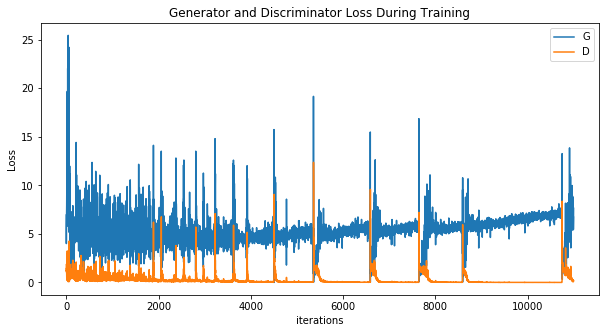

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


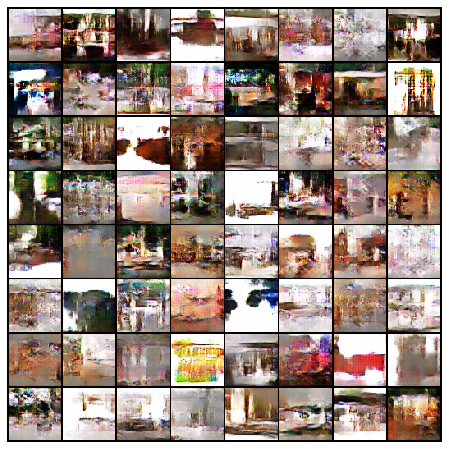

In [15]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())


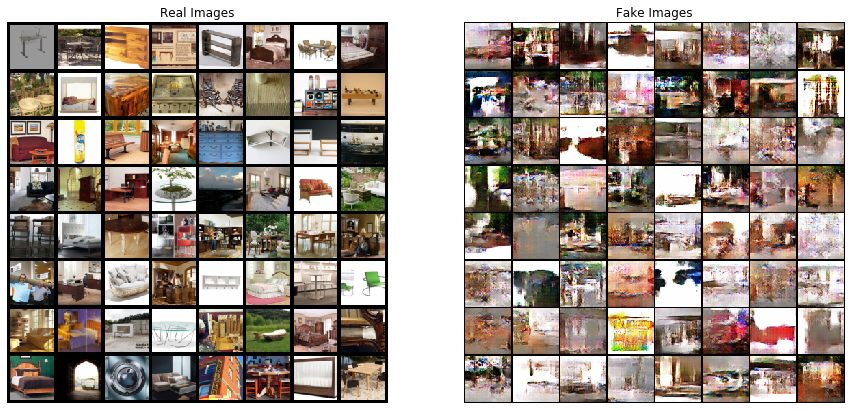

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

